Fonte: `verificacoes_bombas_2018-2.csv` (IPEM-SP, regional São José dos Campos, mar-out/2018)
---
Puxando os dados do IPEM
---
Tratamento: separa `MUNICIPIO` e `BAIRRO`

O endereço é quebrado a partir da direita, pois o nome da rua às vezes contém " - " (ex: `CARAGUÁ - UBATUBA, 6225`)

In [ ]:
import pandas as pd

arquivo = "./verificacoes_bombas_2018-2.csv"

df = pd.read_csv(arquivo, sep=";", encoding="latin1", dtype=str)

def extrairEndereco(endereco):
  partes = endereco.strip().split(" - ")
  return pd.Series({
      "MUNICIPIO": partes[-2].strip(),
      "BAIRRO": partes[-3].strip(),
  })

df = pd.concat([df, df["ENDERECO_COMPLETO"].apply(extrairEndereco)], axis=1)
df["DATAVERIFICACAO"] = pd.to_datetime(df["DATAVERIFICACAO"], dayfirst=True)

df = df.rename(columns={
    "NOMEFANTASIA": "PROPRIETARIO",
    "DESC_ITEM": "DESCRICAO",
    "NR_INMETRO": "NUMERO_INMETRO",
    "NR_SERIE": "NUMERO_SERIE",
    "DATAVERIFICACAO": "DATA_VERIFICACAO",
})

colunas = [
    "MUNICIPIO",
    "BAIRRO",
    "PROPRIETARIO",
    "DESCRICAO",
    "NUMERO_INMETRO",
    "NUMERO_SERIE",
    "DATA_VERIFICACAO",
    "RESULTADO",
]
df = df[colunas]

In [ ]:
df

,MUNICIPIO,BAIRRO,PROPRIETARIO,DESCRICAO,NUMERO_INMETRO,NUMERO_SERIE,DATA_VERIFICACAO,RESULTADO
0,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842380,28000912,2018-03-01,Aprovado
1,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842381,28000912,2018-03-01,Aprovado
2,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842378,28000912,2018-03-01,Aprovado
3,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842379,28000912,2018-03-01,Aprovado
4,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842377,28000912,2018-03-01,Aprovado
5,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842382,28000912,2018-03-01,Aprovado
6,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842388,27990912,2018-03-01,Aprovado
7,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842387,27990912,2018-03-01,Aprovado
8,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842384,27990912,2018-03-01,Aprovado
9,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842383,27990912,2018-03-01,Aprovado


# Seleções

Função que retorna o numero de bombas periciadas

In [ ]:
def nPericiadas(l,resultado=None):
  if resultado:
    return len(l[l["RESULTADO"] == resultado])
  return len(l)

''' print(nPericiadas(df,"Aprovado"))
print(nPericiadas(df,"Reprovado")) '''
print(nPericiadas(df))

5482


Função para retornar apenas lista de aprovados

In [ ]:
def aproRepr(l,a):
  nv=l[l["RESULTADO"] == a]
  return nv

aproRepr(df,"Aprovado")
#aproRepr(df,"Reprovado")
#aproRepr(df,"Interditado")

,MUNICIPIO,BAIRRO,PROPRIETARIO,DESCRICAO,NUMERO_INMETRO,NUMERO_SERIE,DATA_VERIFICACAO,RESULTADO
0,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842380,28000912,2018-03-01,Aprovado
1,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842381,28000912,2018-03-01,Aprovado
2,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842378,28000912,2018-03-01,Aprovado
3,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842379,28000912,2018-03-01,Aprovado
4,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842377,28000912,2018-03-01,Aprovado
5,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842382,28000912,2018-03-01,Aprovado
6,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842388,27990912,2018-03-01,Aprovado
7,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842387,27990912,2018-03-01,Aprovado
8,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842384,27990912,2018-03-01,Aprovado
9,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842383,27990912,2018-03-01,Aprovado


Função que retorna um quantitativo de aprovados reprovados e interditados

In [ ]:
def contarAprRep(l,ar):
  nv = l[l["RESULTADO"]==ar]
  return nv.groupby("MUNICIPIO")["RESULTADO"].count()

print(contarAprRep(df,"Aprovado"))
print(" ")
print(contarAprRep(df,"Reprovado"))
print(" ")
print(contarAprRep(df,"Interditado"))

MUNICIPIO
APARECIDA                   119
ARAPEÍ                        4
AREIAS                        6
BANANAL                      12
BIRITIBA-MIRIM               14
CACHOEIRA PAULISTA           14
CAMPOS DO JORDÃO            121
CANAS                         6
CARAGUATATUBA               397
CAÇAPAVA                    328
CRUZEIRO                    124
CUNHA                        43
GUARAREMA                    86
GUARATINGUETÁ               233
IGARATÁ                      16
JACAREÍ                     290
JAMBEIRO                      4
LAGOINHA                      2
LAVRINHAS                    22
LORENA                      234
MONTEIRO LOBATO               5
NAZARÉ PAULISTA               6
PARAIBUNA                    30
PINDAMONHANGABA             218
PIQUETE                       8
QUELUZ                      124
ROSEIRA                      32
SALESÓPOLIS                  16
SANTA BRANCA                 14
SANTO ANTÔNIO DO PINHAL      22
SILVEIRAS                    3

# Filtros

Função que retorna os dados filtrados por municipio

"pd.set_option('display.max_rows', None)" serve apenas para mostrar todos as linhas retornadas

In [ ]:
pd.set_option('display.max_rows', None)
def filtrarPorMunicipio(l, municipio):
  nv = l[l["MUNICIPIO"].str.strip().str.upper() == municipio.strip().upper()]
  return nv

municipio = input("digite o municipio: ")
display(filtrarPorMunicipio(df, municipio))

digite o municipio: São José dos Campos


,MUNICIPIO,BAIRRO,PROPRIETARIO,DESCRICAO,NUMERO_INMETRO,NUMERO_SERIE,DATA_VERIFICACAO,RESULTADO
90,SÃO JOSÉ DOS CAMPOS,JARDIM DAS INDUSTRIAS,POSTO DA GRUTA,Bomba medidora p/comb.vazão > 20 até 100 L/min.,11612949,29120914,2018-10-01,Aprovado
91,SÃO JOSÉ DOS CAMPOS,JARDIM DAS INDUSTRIAS,POSTO DA GRUTA,Bomba medidora p/comb.vazão > 20 até 100 L/min.,11612950,29120914,2018-10-01,Aprovado
92,SÃO JOSÉ DOS CAMPOS,JARDIM DAS INDUSTRIAS,POSTO DA GRUTA,Bomba medidora p/comb.vazão > 20 até 100 L/min.,11612951,29120914,2018-10-01,Aprovado
93,SÃO JOSÉ DOS CAMPOS,JARDIM DAS INDUSTRIAS,POSTO DA GRUTA,Bomba medidora p/comb.vazão > 20 até 100 L/min.,11612952,29120914,2018-10-01,Aprovado
94,SÃO JOSÉ DOS CAMPOS,JARDIM DAS INDUSTRIAS,POSTO DA GRUTA,Bomba medidora p/comb.vazão > 20 até 100 L/min.,11612953,29120914,2018-10-01,Aprovado
95,SÃO JOSÉ DOS CAMPOS,JARDIM DAS INDUSTRIAS,POSTO DA GRUTA,Bomba medidora p/comb.vazão > 20 até 100 L/min.,11612931,29090914,2018-10-01,Aprovado
96,SÃO JOSÉ DOS CAMPOS,JARDIM DAS INDUSTRIAS,POSTO DA GRUTA,Bomba medidora p/comb.vazão > 20 até 100 L/min.,11612932,29090914,2018-10-01,Aprovado
99,SÃO JOSÉ DOS CAMPOS,JARDIM DAS INDUSTRIAS,POSTO DA GRUTA,Bomba medidora p/comb.vazão > 20 até 100 L/min.,11612933,29090914,2018-10-01,Aprovado
101,SÃO JOSÉ DOS CAMPOS,JARDIM DAS INDUSTRIAS,POSTO DA GRUTA,Bomba medidora p/comb.vazão > 20 até 100 L/min.,11612934,29090914,2018-10-01,Aprovado
102,SÃO JOSÉ DOS CAMPOS,JARDIM DAS INDUSTRIAS,POSTO DA GRUTA,Bomba medidora p/comb.vazão > 20 até 100 L/min.,11612935,29090914,2018-10-01,Aprovado


Função que retorna o percentual de bombas aprovadas e reprovadas

In [ ]:
def percentualAprovadoReprovado(l):
  total = len(l)
  aprovadas = len(l[l["RESULTADO"] == "Aprovado"])
  reprovadas = len(l[l["RESULTADO"] == "Reprovado"])
  interditado = len(l[l["RESULTADO"] == "Interditado"])
  pct_aprovadas = aprovadas / total * 100
  pct_reprovadas = reprovadas / total * 100
  pct_interditado = interditado / total * 100
  return pct_aprovadas, pct_reprovadas, pct_interditado

percentualAprovadoReprovado(df)

(86.13644655235315, 7.880335643925575, 0.565487048522437)

Função que retorna o percentual de todas as categorias de resultado

Necessária aqui porque os dados de SP têm também `Excluído` e `Sem Verif.`, que ficam de fora da função acima

In [ ]:
def percentualPorResultado(l):
  return (l["RESULTADO"].value_counts() / len(l) * 100).round(2)

percentualPorResultado(df)

,count
RESULTADO,
Aprovado,86.14
Reprovado,7.88
Excluído,4.05
Sem Verif.,1.37
Interditado,0.57


Função que retorna os dados filtrados por bairro

In [ ]:
def filtrarPorBairro(l, bairro):
  nv = l[l["BAIRRO"].str.strip().str.upper() == bairro.strip().upper()]
  return nv

bairro = input("digite o bairro: ")
display(filtrarPorBairro(df, bairro))

digite o bairro: Centro


,MUNICIPIO,BAIRRO,PROPRIETARIO,DESCRICAO,NUMERO_INMETRO,NUMERO_SERIE,DATA_VERIFICACAO,RESULTADO
0,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842380,28000912,2018-03-01,Aprovado
1,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842381,28000912,2018-03-01,Aprovado
2,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842378,28000912,2018-03-01,Aprovado
3,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842379,28000912,2018-03-01,Aprovado
4,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842377,28000912,2018-03-01,Aprovado
5,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842382,28000912,2018-03-01,Aprovado
6,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842388,27990912,2018-03-01,Aprovado
7,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842387,27990912,2018-03-01,Aprovado
8,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842384,27990912,2018-03-01,Aprovado
9,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842383,27990912,2018-03-01,Aprovado


Função que retorna data de início e data final

In [ ]:
def filtrarPorData(l, data_inicio=None, data_final=None, modo=None):
    # data_inicio, modo='S' --> somente uma data
    # data_inicio, modo='I' --> datas maiores ou iguais a inicial
    # data_inicio, data_final, modo='I' --> intervalo entre as datas
    # data_inicio, data_final, modo='S' --> somente data_inicio

    if not (data_inicio or data_final): return "Insira pelo menos uma data."
    if modo is None: return "Coloque o modo ('S' = singular / 'I' = intervalo)"

    modo = modo.upper()
    inicio = pd.to_datetime(data_inicio, dayfirst=True) if data_inicio else None
    final = pd.to_datetime(data_final, dayfirst=True) if data_final else None

    # modo singular
    if modo == 'S':
        if not inicio: return "No modo singular, informe uma data."
        if final:
            return "No modo singular, informe apenas uma data."
        comparado = l["DATA_VERIFICACAO"] == inicio

    # modo intervalo
    elif modo == 'I':
        comparado = (l["DATA_VERIFICACAO"] >= inicio) if inicio else (l["DATA_VERIFICACAO"] <= final)
        if inicio and final:
            comparado &= l["DATA_VERIFICACAO"] <= final

    else:
        return "Modo inválido. Use 'S' ou 'I'."

    resultado = l[comparado]
    return resultado if not resultado.empty else "Não há nenhum valor."


In [ ]:
filtrarPorData(df, "2018-11-26", "2018-04-27", modo="s")

/tmp/ipykernel_1591/1810767966.py:7: UserWarning: Parsing dates in %Y-%m-%d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  if data_inicio is not None:data_inicio = pd.to_datetime(data_inicio, dayfirst=True)
/tmp/ipykernel_1591/1810767966.py:8: UserWarning: Parsing dates in %Y-%m-%d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  if data_final is not None:data_final = pd.to_datetime(data_final, dayfirst=True)


,MUNICIPIO,BAIRRO,PROPRIETARIO,DESCRICAO,NUMERO_INMETRO,NUMERO_SERIE,DATA_VERIFICACAO,RESULTADO
4866,SÃO JOSÉ DOS CAMPOS,BOSQUE DOS EUCALIPTOS,SALINAS AUTO POSTO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842196,136100,2018-11-26,Aprovado
4867,SÃO JOSÉ DOS CAMPOS,BOSQUE DOS EUCALIPTOS,SALINAS AUTO POSTO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842197,136100,2018-11-26,Aprovado
4868,SÃO JOSÉ DOS CAMPOS,BOSQUE DOS EUCALIPTOS,SALINAS AUTO POSTO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842198,136101,2018-11-26,Aprovado
4869,SÃO JOSÉ DOS CAMPOS,BOSQUE DOS EUCALIPTOS,SALINAS AUTO POSTO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842199,136101,2018-11-26,Aprovado
4870,SÃO JOSÉ DOS CAMPOS,BOSQUE DOS EUCALIPTOS,SALINAS AUTO POSTO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,473045,136102,2018-11-26,Aprovado
4871,SÃO JOSÉ DOS CAMPOS,BOSQUE DOS EUCALIPTOS,SALINAS AUTO POSTO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,473044,136102,2018-11-26,Aprovado
4872,SÃO JOSÉ DOS CAMPOS,BOSQUE DOS EUCALIPTOS,SALINAS AUTO POSTO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,14928529,136104,2018-11-26,Aprovado
4873,SÃO JOSÉ DOS CAMPOS,BOSQUE DOS EUCALIPTOS,SALINAS AUTO POSTO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,14928530,136104,2018-11-26,Aprovado
4874,SÃO JOSÉ DOS CAMPOS,BOSQUE DOS EUCALIPTOS,SALINAS AUTO POSTO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,14928528,136103,2018-11-26,Aprovado
4875,SÃO JOSÉ DOS CAMPOS,BOSQUE DOS EUCALIPTOS,SALINAS AUTO POSTO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,473042,136103,2018-11-26,Aprovado


In [ ]:
filtrarPorData(df, "2018-04-05", modo="s")

'Não há nenhum valor.'

Função que retorna os dados filtrados por proprietário (nome fantasia)

In [ ]:
def filtrarPorProprietario(l,fornecedor):
  nv = l[l["PROPRIETARIO"].str.strip().str.upper() == fornecedor.strip().upper()]
  return nv

display(filtrarPorProprietario(df, "POSTO DOM PEDRO GUARA URBANO"))

,MUNICIPIO,BAIRRO,PROPRIETARIO,DESCRICAO,NUMERO_INMETRO,NUMERO_SERIE,DATA_VERIFICACAO,RESULTADO
0,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842380,28000912,2018-03-01,Aprovado
1,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842381,28000912,2018-03-01,Aprovado
2,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842378,28000912,2018-03-01,Aprovado
3,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842379,28000912,2018-03-01,Aprovado
4,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842377,28000912,2018-03-01,Aprovado
5,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842382,28000912,2018-03-01,Aprovado
6,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842388,27990912,2018-03-01,Aprovado
7,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842387,27990912,2018-03-01,Aprovado
8,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842384,27990912,2018-03-01,Aprovado
9,GUARATINGUETÁ,CENTRO,POSTO DOM PEDRO GUARA URBANO,Bomba medidora p/comb.vazão > 20 até 100 L/min.,12842383,27990912,2018-03-01,Aprovado


# Gráficos das bombas

Periciadas

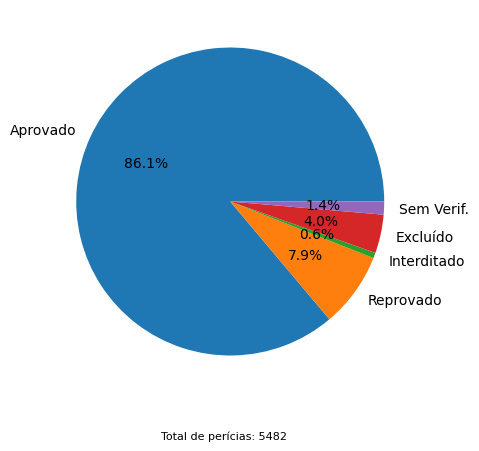

In [ ]:
import matplotlib.pyplot as plt

# tem q fazer um dicionário para o grafico ler
dados = pd.Series({
    "Aprovado": nPericiadas(df, "Aprovado"),
    "Reprovado": nPericiadas(df, "Reprovado"),
    "Interditado": nPericiadas(df, "Interditado"),
    "Excluído": nPericiadas(df, "Excluído"),
    "Sem Verif.": nPericiadas(df, "Sem Verif.")
})

# cria o gráfico
plot = dados.plot.pie(
    figsize=(5, 5),
    autopct="%1.1f%%"
)

plt.figtext(
    0.5, 0.02,
    f"Total de perícias: {nPericiadas(df)}",
    ha="center",
    fontsize=8
)

plt.show()